# CCADMACL (Midterm Exam)

## Import the libraries

In [62]:
import numpy as np
import pandas as pd
import seaborn as sns

from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from mpl_toolkits.mplot3d import Axes3D

from collections import Counter

## Load the datasets

In [63]:
face_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/face.csv?raw=true")
chrome_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/chrome.csv?raw=true")
lines2_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/lines2.csv?raw=true")
supernova_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/supernova.csv?raw=true")
network_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/network.csv?raw=true")
spirals_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/spirals.csv?raw=true")
densedisk_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/densedisk.csv?raw=true")
rings_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/rings.csv?raw=true")
chainlink_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/chainlink.csv?raw=true")

## Plot the datasets

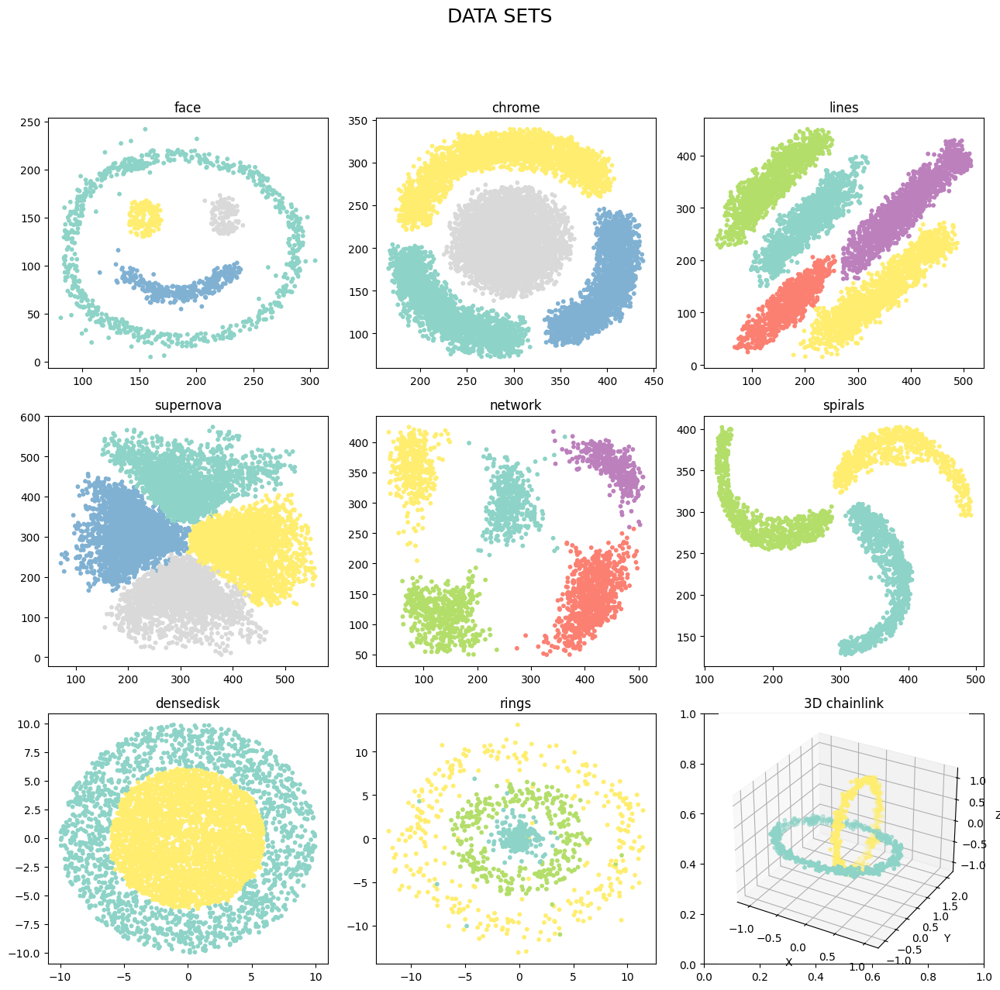

In [64]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(13, 13))
fig.suptitle('DATA SETS\n', size=18)

# Plot the 2D scatterplots
axes[0, 0].scatter(face_df['x'], face_df['y'], c=face_df['color'], s=10, cmap="Set3")
axes[0, 0].set_title("face")

axes[0, 1].scatter(chrome_df['x'], chrome_df['y'], c=chrome_df['color'], s=10, cmap="Set3")
axes[0, 1].set_title("chrome")

axes[0, 2].scatter(lines2_df['x'], lines2_df['y'], c=lines2_df['color'], s=10, cmap="Set3")
axes[0, 2].set_title("lines")

axes[1, 0].scatter(supernova_df['x'], supernova_df['y'], c=supernova_df['color'], s=10, cmap="Set3")
axes[1, 0].set_title("supernova")

axes[1, 1].scatter(network_df['x'], network_df['y'], c=network_df['color'], s=10, cmap="Set3")
axes[1, 1].set_title("network")

axes[1, 2].scatter(spirals_df['x'], spirals_df['y'], c=spirals_df['color'], s=10, cmap="Set3")
axes[1, 2].set_title("spirals")

axes[2, 0].scatter(densedisk_df['x'], densedisk_df['y'], c=densedisk_df['color'], s=10, cmap="Set3")
axes[2, 0].set_title("densedisk")

axes[2, 1].scatter(rings_df['x'], rings_df['y'], c=rings_df['color'], s=10, cmap="Set3")
axes[2, 1].set_title("rings")

# Add a 3D plot
ax3d = fig.add_subplot(3, 3, 9, projection='3d')
ax3d.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'], c=chainlink_df['color'], cmap="Set3", s=10)
ax3d.set_title("3D chainlink")
ax3d.set_xlabel("X")
ax3d.set_ylabel("Y")
ax3d.set_zlabel("Z")

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])

In [97]:
face_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1273 entries, 0 to 1272
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0.1  1273 non-null   int64  
 1   x             1273 non-null   float64
 2   y             1273 non-null   float64
 3   color         1273 non-null   int64  
dtypes: float64(2), int64(2)
memory usage: 39.9 KB


In [98]:
chainlink_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x       1000 non-null   float64
 1   y       1000 non-null   float64
 2   z       1000 non-null   float64
 3   color   1000 non-null   int64  
dtypes: float64(3), int64(1)
memory usage: 31.4 KB


## A. Use K-means to cluster each dataset

1. Create each copy of the dataset for k-means

In [65]:
face_df_KMcopy = face_df.copy()
chrome_df_KMcopy = chrome_df.copy()
lines2_df_KMcopy = lines2_df.copy()
supernova_df_KMcopy = supernova_df.copy()
network_df_KMcopy = network_df.copy()
spirals_df_KMcopy = spirals_df.copy()
densedisk_df_KMcopy = densedisk_df.copy()
rings_df_KMcopy = rings_df.copy()
chainlink_df_KMcopy = chainlink_df.copy()

2. Drop the "color" column on all datasets

In [66]:
face_df_KMcopy = face_df_KMcopy.drop('color', axis=1)
chrome_df_KMcopy = chrome_df_KMcopy.drop('color', axis=1)
lines2_df_KMcopy = lines2_df_KMcopy.drop('color', axis=1)
supernova_df_KMcopy = supernova_df_KMcopy.drop('color', axis=1)
network_df_KMcopy = network_df_KMcopy.drop('color', axis=1)
spirals_df_KMcopy = spirals_df_KMcopy.drop('color', axis=1)
densedisk_df_KMcopy = densedisk_df_KMcopy.drop('color', axis=1)
rings_df_KMcopy = rings_df_KMcopy.drop('color', axis=1)
chainlink_df_KMcopy = chainlink_df_KMcopy.drop('color', axis=1)

3. Train a K-means model for each dataset.

In [67]:
def cluster_dataset(df, n_clusters):
    # Run KMeans with high `n_init`
    kmeans = KMeans(n_clusters=n_clusters, n_init=50, random_state=42)
    df['cluster'] = kmeans.fit_predict(df)
    return df, kmeans


In [68]:
def find_best_kmeans(df, n_clusters, n_runs=50):
    best_inertia = np.inf  # Set initial inertia to infinity
    best_model = None

    for _ in range(n_runs):
        kmeans = KMeans(n_clusters=n_clusters, random_state=None)  # Random initialization
        kmeans.fit(df)

        if kmeans.inertia_ < best_inertia:
            best_inertia = kmeans.inertia_
            best_model = kmeans

    # Add the cluster labels to the dataset
    df['cluster'] = best_model.predict(df)
    return df, best_model


In [69]:
face_df_KMcopy, face_kmeans = find_best_kmeans(face_df_KMcopy, n_clusters=3)
chrome_df_KMcopy, chrome_kmeans = find_best_kmeans(chrome_df_KMcopy, n_clusters=4)
lines2_df_KMcopy, lines2_kmeans = find_best_kmeans(lines2_df_KMcopy, n_clusters=5)
supernova_df_KMcopy, supernova_kmeans = find_best_kmeans(supernova_df_KMcopy, n_clusters=4)
network_df_KMcopy, network_kmeans = find_best_kmeans(network_df_KMcopy, n_clusters=5)
spirals_df_KMcopy, spirals_kmeans = find_best_kmeans(spirals_df_KMcopy, n_clusters=3)
densedisk_df_KMcopy, densedisk_kmeans = find_best_kmeans(densedisk_df_KMcopy, n_clusters=2)
rings_df_KMcopy, rings_kmeans = find_best_kmeans(rings_df_KMcopy, n_clusters=3)
chainlink_df_KMcopy, chainlink_kmeans = find_best_kmeans(chainlink_df_KMcopy[['x', 'y', 'z']], n_clusters=2)


4. Add a "Cluster" column for each data set

In [70]:
# It is already added to the function above df['cluster']

5. Plot the Correct cluster and the K-means cluster

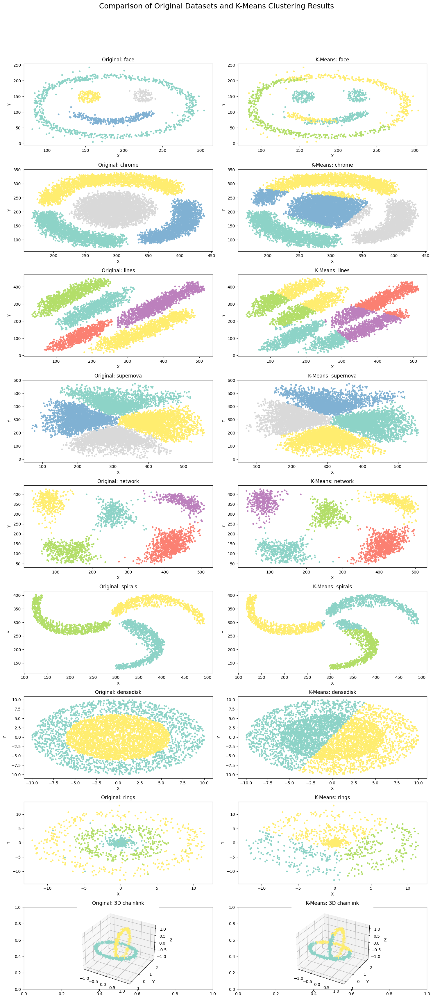

In [128]:
# Side-by-side comparison visualization with 2 columns
fig, axes = plt.subplots(nrows=9, ncols=2, figsize=(15, 35))  # 2 columns for side-by-side comparison
fig.suptitle('Comparison of Original Datasets and K-Means Clustering Results\n', size=18)

# List of datasets and their titles
original_dfs = [
    face_df, chrome_df, lines2_df,
    supernova_df, network_df, spirals_df,
    densedisk_df, rings_df, chainlink_df
]
kmeans_dfs = [
    face_df_KMcopy, chrome_df_KMcopy, lines2_df_KMcopy,
    supernova_df_KMcopy, network_df_KMcopy, spirals_df_KMcopy,
    densedisk_df_KMcopy, rings_df_KMcopy, chainlink_df_KMcopy
]
titles = ["face", "chrome", "lines", "supernova", "network", "spirals", "densedisk", "rings", "3D chainlink"]

# Plotting datasets and K-Means clustering results
for i, (orig_df, km_df, title) in enumerate(zip(original_dfs, kmeans_dfs, titles)):
    # Plot original dataset
    if title != "3D chainlink":
        axes[i, 0].scatter(orig_df['x'], orig_df['y'], c=orig_df['color'], s=10, cmap="Set3")
        axes[i, 0].set_title(f"Original: {title}")
        axes[i, 0].set_xlabel("X")
        axes[i, 0].set_ylabel("Y")
    else:  # Special case for 3D
        ax3d_orig = fig.add_subplot(9, 2, i * 2 + 1, projection='3d')
        ax3d_orig.scatter(orig_df['x'], orig_df['y'], orig_df['z'], c=orig_df['color'], cmap="Set3", s=10)
        ax3d_orig.set_title(f"Original: {title}")
        ax3d_orig.set_xlabel("X")
        ax3d_orig.set_ylabel("Y")
        ax3d_orig.set_zlabel("Z")

    # Plot K-Means clustering results
    if title != "3D chainlink":
        axes[i, 1].scatter(km_df['x'], km_df['y'], c=km_df['cluster'], s=10, cmap="Set3")
        axes[i, 1].set_title(f"K-Means: {title}")
        axes[i, 1].set_xlabel("X")
        axes[i, 1].set_ylabel("Y")
    else:  # Special case for 3D
        ax3d_km = fig.add_subplot(9, 2, i * 2 + 2, projection='3d')
        ax3d_km.scatter(km_df['x'], km_df['y'], km_df['z'], c=km_df['cluster'], cmap="Set3", s=10)
        ax3d_km.set_title(f"K-Means: {title}")
        ax3d_km.set_xlabel("X")
        ax3d_km.set_ylabel("Y")
        ax3d_km.set_zlabel("Z")

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


## B. Use Agglomerative Clustering to cluster each dataset

1. Create each copy of the dataset for Agglomerative Clustering

In [83]:
face_df_ACcopy = face_df.copy()
chrome_df_ACcopy = chrome_df.copy()
lines2_df_ACcopy = lines2_df.copy()
supernova_df_ACcopy = supernova_df.copy()
network_df_ACcopy = network_df.copy()
spirals_df_ACcopy = spirals_df.copy()
densedisk_df_ACcopy = densedisk_df.copy()
rings_df_ACcopy = rings_df.copy()
chainlink_df_ACcopy = chainlink_df.copy()

2. Drop the "color" column on all datasets

In [84]:
face_df_ACcopy = face_df_ACcopy.drop('color', axis=1)
chrome_df_ACcopy = chrome_df_ACcopy.drop('color', axis=1)
lines2_df_ACcopy = lines2_df_ACcopy.drop('color', axis=1)
supernova_df_ACcopy = supernova_df_ACcopy.drop('color', axis=1)
network_df_ACcopy = network_df_ACcopy.drop('color', axis=1)
spirals_df_ACcopy = spirals_df_ACcopy.drop('color', axis=1)
densedisk_df_ACcopy = densedisk_df_ACcopy.drop('color', axis=1)
rings_df_ACcopy = rings_df_ACcopy.drop('color', axis=1)
chainlink_df_ACcopy = chainlink_df_ACcopy.drop('color', axis=1)

3. Train a Agglomerative Clustering model for each dataset.

In [85]:
def train_agglomerative(df, n_clusters):
    # Create an Agglomerative Clustering model
    agglomerative = AgglomerativeClustering(n_clusters=n_clusters)

    # Fit the model to the data
    df['cluster'] = agglomerative.fit_predict(df)

    return df, agglomerative

In [86]:
face_df_ACcopy, face_agglomerative = train_agglomerative(face_df_ACcopy, n_clusters=3)
chrome_df_ACcopy, chrome_agglomerative = train_agglomerative(chrome_df_ACcopy, n_clusters=4)
lines2_df_ACcopy, lines2_agglomerative = train_agglomerative(lines2_df_ACcopy, n_clusters=5)
supernova_df_ACcopy, supernova_agglomerative = train_agglomerative(supernova_df_ACcopy, n_clusters=4)
network_df_ACcopy, network_agglomerative = train_agglomerative(network_df_ACcopy, n_clusters=5)
spirals_df_ACcopy, spirals_agglomerative = train_agglomerative(spirals_df_ACcopy, n_clusters=3)
densedisk_df_ACcopy, densedisk_agglomerative = train_agglomerative(densedisk_df_ACcopy, n_clusters=2)
rings_df_ACcopy, rings_agglomerative = train_agglomerative(rings_df_ACcopy, n_clusters=3)
chainlink_df_ACcopy, chainlink_agglomerative = train_agglomerative(chainlink_df_ACcopy[['x', 'y', 'z']], n_clusters=2)

4. Add a "Cluster" column for each data set

In [87]:
# it is already added in the function

5. Plot the Correct cluster and the Agglomerative cluster

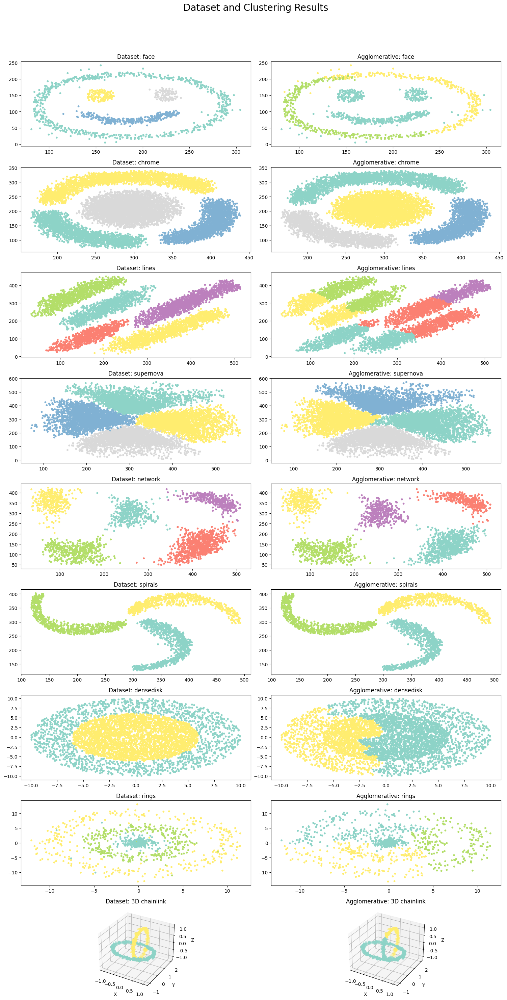

In [127]:
fig, axes = plt.subplots(nrows=9, ncols=2, figsize=(15,30))
fig.suptitle('Dataset and Clustering Results\n', size=20)

# Dataset titles and data
datasets = [
    (face_df, "face"),
    (chrome_df, "chrome"),
    (lines2_df, "lines"),
    (supernova_df, "supernova"),
    (network_df, "network"),
    (spirals_df, "spirals"),
    (densedisk_df, "densedisk"),
    (rings_df, "rings"),
    (chainlink_df, "3D chainlink")
]

# Clustering results (Agglomerative/K-Means) datasets
clusters = [
    (face_df_ACcopy, "Agglomerative"),
    (chrome_df_ACcopy, "Agglomerative"),
    (lines2_df_ACcopy, "Agglomerative"),
    (supernova_df_ACcopy, "Agglomerative"),
    (network_df_ACcopy, "Agglomerative"),
    (spirals_df_ACcopy, "Agglomerative"),
    (densedisk_df_ACcopy, "Agglomerative"),
    (rings_df_ACcopy, "Agglomerative"),
    (chainlink_df_ACcopy, "Agglomerative")
]

# Loop through datasets and plot in two columns
for row, ((data, title), (cluster, cluster_title)) in enumerate(zip(datasets, clusters)):
    # Original dataset plot (first column)
    if title != "3D chainlink":  # 2D scatter plot
        axes[row, 0].scatter(data['x'], data['y'], c=data['color'], s=10, cmap="Set3")
        axes[row, 0].set_title(f"Dataset: {title}")
    else:  # 3D scatter plot
        ax3d_data = fig.add_subplot(9, 2, row * 2 + 1, projection='3d')
        ax3d_data.scatter(data['x'], data['y'], data['z'], c=data['color'], s=10, cmap="Set3")
        ax3d_data.set_title(f"Dataset: {title}")
        ax3d_data.set_xlabel("X")
        ax3d_data.set_ylabel("Y")
        ax3d_data.set_zlabel("Z")
        axes[row, 0].remove()  # Remove unused placeholder axes for 3D plot

    # Clustering result plot (second column)
    if title != "3D chainlink":  # 2D scatter plot
        axes[row, 1].scatter(cluster['x'], cluster['y'], c=cluster['cluster'], s=10, cmap="Set3")
        axes[row, 1].set_title(f"{cluster_title}: {title}")
    else:  # 3D scatter plot
        ax3d_cluster = fig.add_subplot(9, 2, row * 2 + 2, projection='3d')
        ax3d_cluster.scatter(cluster['x'], cluster['y'], cluster['z'], c=cluster['cluster'], s=10, cmap="Set3")
        ax3d_cluster.set_title(f"{cluster_title}: {title}")
        ax3d_cluster.set_xlabel("X")
        ax3d_cluster.set_ylabel("Y")
        ax3d_cluster.set_zlabel("Z")
        axes[row, 1].remove()  # Remove unused placeholder axes for 3D plot

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


## C. Use DBSCAN to cluster each dataset

1. Create each copy of the dataset for Agglomerative Clustering

In [134]:
face_df_DBcopy = face_df.copy()
chrome_df_DBcopy = chrome_df.copy()
lines2_df_DBcopy = lines2_df.copy()
supernova_df_DBcopy = supernova_df.copy()
network_df_DBcopy = network_df.copy()
spirals_df_DBcopy = spirals_df.copy()
densedisk_df_DBcopy = densedisk_df.copy()
rings_df_DBcopy = rings_df.copy()
chainlink_df_DBcopy = chainlink_df.copy()

2. Drop the "color" column on all datasets

In [135]:
# Drop the 'color' column
datasets = {
    "face": face_df_DBcopy,
    "chrome": chrome_df_DBcopy,
    "lines": lines2_df_DBcopy,
    "supernova": supernova_df_DBcopy,
    "network": network_df_DBcopy,
    "spirals": spirals_df_DBcopy,
    "densedisk": densedisk_df_DBcopy,
    "rings": rings_df_DBcopy,
    "chainlink": chainlink_df_DBcopy
}

3. Train a DBSCAN Clustering model for each dataset.

In [136]:
# Define the target number of clusters for each dataset
target_clusters = {
    "face": 4,
    "chrome": 4,
    "lines": 5,
    "supernova": 4,
    "network": 5,
    "spirals": 3,
    "densedisk": 2,
    "rings": 3,
    "chainlink": 2
}

# Function to find the optimal DBSCAN hyperparameters
def find_best_dbscan_params(df, target_clusters):
    distance_matrix = pairwise_distances(df[['x', 'y']] if 'z' not in df else df[['x', 'y', 'z']])
    distances = np.sort(distance_matrix.flatten())
    eps = distances[int(len(distances) * 0.1)]  # Top 10% distance as eps
    min_samples = max(2, len(df) // 10)  # Set min_samples based on dataset size

    best_dbscan = None
    best_eps = eps
    best_min_samples = min_samples

    for eps_trial in np.linspace(0.1, eps, 10):
        for min_samples_trial in range(2, min_samples + 2):
            dbscan = DBSCAN(eps=eps_trial, min_samples=min_samples_trial)
            labels = dbscan.fit_predict(df[['x', 'y']] if 'z' not in df else df[['x', 'y', 'z']])
            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
            if n_clusters == target_clusters:
                best_dbscan = dbscan
                best_eps = eps_trial
                best_min_samples = min_samples_trial
                break
        if best_dbscan:
            break

    return best_dbscan, best_eps, best_min_samples

# Apply DBSCAN and store hyperparameters
trained_datasets = {}
hyperparams = {}

for name, df in datasets.items():
    dbscan_model, eps, min_samples = find_best_dbscan_params(df, target_clusters[name])
    df['cluster'] = dbscan_model.fit_predict(df[['x', 'y']] if 'z' not in df else df[['x', 'y', 'z']])
    trained_datasets[name] = (df, dbscan_model)
    hyperparams[name] = {
        "eps": eps,
        "min_samples": min_samples
    }

# Print hyperparameters for each dataset
print("DBSCAN Hyperparameters for Visualization:")
for name, params in hyperparams.items():
    print(f"Dataset: {name}, eps: {params['eps']}, min_samples: {params['min_samples']}")

DBSCAN Hyperparameters for Visualization:
Dataset: face, eps: 9.004611820275256, min_samples: 3
Dataset: chrome, eps: 4.574691755790971, min_samples: 45
Dataset: lines, eps: 15.255433118275421, min_samples: 14
Dataset: supernova, eps: 7.233322988229313, min_samples: 53
Dataset: network, eps: 5.441717462917616, min_samples: 17
Dataset: spirals, eps: 4.602149870923177, min_samples: 23
Dataset: densedisk, eps: 0.40162233128052616, min_samples: 12
Dataset: rings, eps: 0.1, min_samples: 7
Dataset: chainlink, eps: 0.1, min_samples: 2


4. Add a "Cluster" column for each data set

In [137]:
# already added in the model

5. Plot the Correct cluster and the DBSCAN cluster

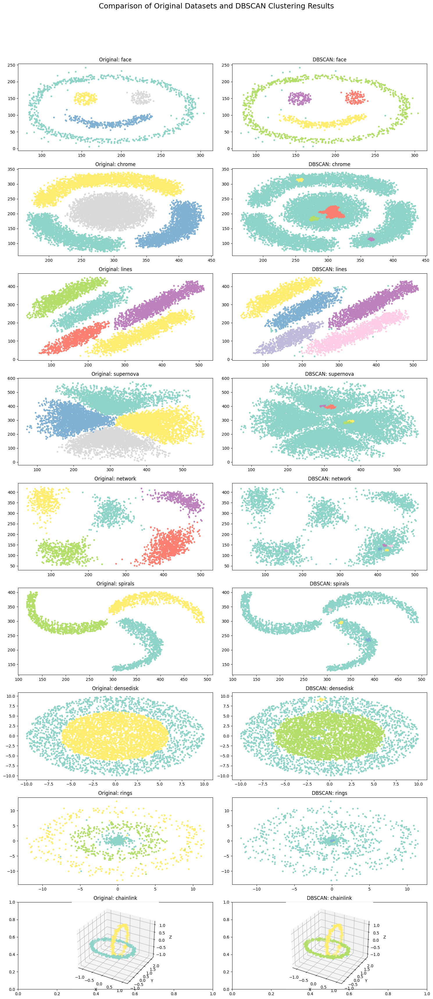

In [138]:
# Plot original and DBSCAN clustering results
fig, axes = plt.subplots(nrows=9, ncols=2, figsize=(15, 35))
fig.suptitle('Comparison of Original Datasets and DBSCAN Clustering Results\n', size=18)

titles = list(trained_datasets.keys())

for i, title in enumerate(titles):
    row = i

    # Plot original dataset
    if title == "chainlink":
        ax3d_orig = fig.add_subplot(9, 2, i * 2 + 1, projection='3d')
        df, _ = datasets[title], None
        ax3d_orig.scatter(df['x'], df['y'], df['z'], c=df['color'], cmap="Set3", s=10)
        ax3d_orig.set_title("Original: " + title)
        ax3d_orig.set_xlabel("X")
        ax3d_orig.set_ylabel("Y")
        ax3d_orig.set_zlabel("Z")
    else:
        df = datasets[title]
        axes[row, 0].scatter(df['x'], df['y'], c=df['color'], s=10, cmap="Set3")
        axes[row, 0].set_title("Original: " + title)

    # Plot DBSCAN results
    if title == "chainlink":
        ax3d_dbscan = fig.add_subplot(9, 2, i * 2 + 2, projection='3d')
        df, _ = trained_datasets[title]
        ax3d_dbscan.scatter(df['x'], df['y'], df['z'], c=df['cluster'], cmap="Set3", s=10)
        ax3d_dbscan.set_title("DBSCAN: " + title)
        ax3d_dbscan.set_xlabel("X")
        ax3d_dbscan.set_ylabel("Y")
        ax3d_dbscan.set_zlabel("Z")
    else:
        df, _ = trained_datasets[title]
        axes[row, 1].scatter(df['x'], df['y'], c=df['cluster'], s=10, cmap="Set3")
        axes[row, 1].set_title("DBSCAN: " + title)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


## D. Compare all algorithms

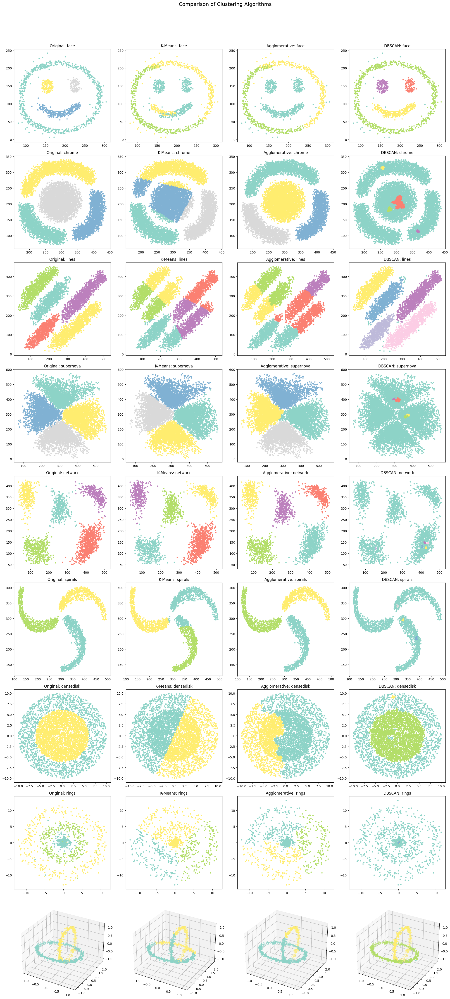

In [140]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

datasets = [
    ("face", face_df, face_df_KMcopy, face_df_ACcopy, face_df_DBcopy),
    ("chrome", chrome_df, chrome_df_KMcopy, chrome_df_ACcopy, chrome_df_DBcopy),
    ("lines", lines2_df, lines2_df_KMcopy, lines2_df_ACcopy, lines2_df_DBcopy),
    ("supernova", supernova_df, supernova_df_KMcopy, supernova_df_ACcopy, supernova_df_DBcopy),
    ("network", network_df, network_df_KMcopy, network_df_ACcopy, network_df_DBcopy),
    ("spirals", spirals_df, spirals_df_KMcopy, spirals_df_ACcopy, spirals_df_DBcopy),
    ("densedisk", densedisk_df, densedisk_df_KMcopy, densedisk_df_ACcopy, densedisk_df_DBcopy),
    ("rings", rings_df, rings_df_KMcopy, rings_df_ACcopy, rings_df_DBcopy),
    ("chainlink", chainlink_df, chainlink_df_KMcopy, chainlink_df_ACcopy, chainlink_df_DBcopy),
]


fig, axes = plt.subplots(nrows=len(datasets), ncols=4, figsize=(20, 5 * len(datasets)))
fig.suptitle('Comparison of Clustering Algorithms', fontsize=16)

for i, (title, original_df, kmeans_df, ac_df, dbscan_df) in enumerate(datasets):

    # Plot original dataset
    axes[i, 0].scatter(original_df['x'], original_df['y'], c=original_df['color'], s=10, cmap="Set3")
    axes[i, 0].set_title(f"Original: {title}")

    # Plot K-means clustering
    axes[i, 1].scatter(kmeans_df['x'], kmeans_df['y'], c=kmeans_df['cluster'], s=10, cmap="Set3")
    axes[i, 1].set_title(f"K-Means: {title}")

    # Plot Agglomerative clustering
    axes[i, 2].scatter(ac_df['x'], ac_df['y'], c=ac_df['cluster'], s=10, cmap="Set3")
    axes[i, 2].set_title(f"Agglomerative: {title}")

    # Plot DBSCAN clustering
    axes[i, 3].scatter(dbscan_df['x'], dbscan_df['y'], c=dbscan_df['cluster'], s=10, cmap="Set3")
    axes[i, 3].set_title(f"DBSCAN: {title}")

    if title == "chainlink":
        # 3D plot for chainlink
        for j in range(4):
              ax = fig.add_subplot(len(datasets), 4, i*4 + j + 1, projection='3d')
              if j == 0:
                  ax.scatter(original_df['x'], original_df['y'], original_df['z'], c=original_df['color'], s=10, cmap="Set3")
              elif j == 1:
                  ax.scatter(kmeans_df['x'], kmeans_df['y'], kmeans_df['z'], c=kmeans_df['cluster'], s=10, cmap="Set3")
              elif j==2:
                  ax.scatter(ac_df['x'], ac_df['y'], ac_df['z'], c=ac_df['cluster'], s=10, cmap="Set3")
              else:
                  ax.scatter(dbscan_df['x'], dbscan_df['y'], dbscan_df['z'], c=dbscan_df['cluster'], s=10, cmap="Set3")


              # Remove the 2D plot placeholders
              axes[i,j].remove()


plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

1. Display the Correct cluster, K-means cluster, Agglomerative cluster and DBSCAN cluster in a single plot.

- Each row should contain each dataset
- Each column should contain each the correct cluster, k-means cluster, agglomerative cluster and DBSCAN cluster.